Problem

What metrics can we use to estimate the sale price of home using the Ames Iowa Data.

In [1]:
#import stuff I need and data

In [2]:
import pandas as pd
from sklearn.linear_model import LinearRegression
import numpy as np
import matplotlib.pyplot as plt
from sklearn import metrics
import seaborn as sns
from sklearn.preprocessing import StandardScaler
%matplotlib inline

In [3]:
train=pd.read_csv('./datasets/train.csv',index_col='Id')
test=pd.read_csv('./datasets/test.csv',index_col='Id')

In [4]:
#change pandas settings for rows and columns

In [5]:
pd.options.display.max_columns=100
pd.options.display.max_rows=3000

In [6]:
#data checks

In [7]:
train.head()

,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
109,533352170,60,RL,NaN,13517,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,Sawyer,RRAe,Norm,1Fam,2Story,6,8,1976,2005,Gable,CompShg,HdBoard,Plywood,BrkFace,289.0,Gd,TA,CBlock,TA,TA,No,GLQ,533.0,Unf,0.0,192.0,725.0,GasA,Ex,Y,SBrkr,725,754,0,1479,0.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,1976.0,RFn,2.0,475.0,TA,TA,Y,0,44,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,130500
544,531379050,60,RL,43.0,11492,Pave,NaN,IR1,Lvl,AllPub,CulDSac,Gtl,SawyerW,Norm,Norm,1Fam,2Story,7,5,1996,1997,Gable,CompShg,VinylSd,VinylSd,BrkFace,132.0,Gd,TA,PConc,Gd,TA,No,GLQ,637.0,Unf,0.0,276.0,913.0,GasA,Ex,Y,SBrkr,913,1209,0,2122,1.0,0.0,2,1,4,1,Gd,8,Typ,1,TA,Attchd,1997.0,RFn,2.0,559.0,TA,TA,Y,0,74,0,0,0,0,NaN,NaN,NaN,0,4,2009,WD,220000
153,535304180,20,RL,68.0,7922,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1953,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,Gd,CBlock,TA,TA,No,GLQ,731.0,Unf,0.0,326.0,1057.0,GasA,TA,Y,SBrkr,1057,0,0,1057,1.0,0.0,1,0,3,1,Gd,5,Typ,0,NaN,Detchd,1953.0,Unf,1.0,246.0,TA,TA,Y,0,52,0,0,0,0,NaN,NaN,NaN,0,1,2010,WD,109000
318,916386060,60,RL,73.0,9802,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,2Story,5,5,2006,2007,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,384.0,384.0,GasA,Gd,Y,SBrkr,744,700,0,1444,0.0,0.0,2,1,3,1,TA,7,Typ,0,NaN,BuiltIn,2007.0,Fin,2.0,400.0,TA,TA,Y,100,0,0,0,0,0,NaN,NaN,NaN,0,4,2010,WD,174000
255,906425045,50,RL,82.0,14235,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SawyerW,Norm,Norm,1Fam,1.5Fin,6,8,1900,1993,Gable,CompShg,Wd Sdng,Plywood,None,0.0,TA,TA,PConc,Fa,Gd,No,Unf,0.0,Unf,0.0,676.0,676.0,GasA,TA,Y,SBrkr,831,614,0,1445,0.0,0.0,2,0,3,1,TA,6,Typ,0,NaN,Detchd,1957.0,Unf,2.0,484.0,TA,TA,N,0,59,0,0,0,0,NaN,NaN,NaN,0,3,2010,WD,138500


In [8]:
test.head()

,PID,MS SubClass,MS Zoning,Lot Frontage,Lot Area,Street,Alley,Lot Shape,Land Contour,Utilities,Lot Config,Land Slope,Neighborhood,Condition 1,Condition 2,Bldg Type,House Style,Overall Qual,Overall Cond,Year Built,Year Remod/Add,Roof Style,Roof Matl,Exterior 1st,Exterior 2nd,Mas Vnr Type,Mas Vnr Area,Exter Qual,Exter Cond,Foundation,Bsmt Qual,Bsmt Cond,Bsmt Exposure,BsmtFin Type 1,BsmtFin SF 1,BsmtFin Type 2,BsmtFin SF 2,Bsmt Unf SF,Total Bsmt SF,Heating,Heating QC,Central Air,Electrical,1st Flr SF,2nd Flr SF,Low Qual Fin SF,Gr Liv Area,Bsmt Full Bath,Bsmt Half Bath,Full Bath,Half Bath,Bedroom AbvGr,Kitchen AbvGr,Kitchen Qual,TotRms AbvGrd,Functional,Fireplaces,Fireplace Qu,Garage Type,Garage Yr Blt,Garage Finish,Garage Cars,Garage Area,Garage Qual,Garage Cond,Paved Drive,Wood Deck SF,Open Porch SF,Enclosed Porch,3Ssn Porch,Screen Porch,Pool Area,Pool QC,Fence,Misc Feature,Misc Val,Mo Sold,Yr Sold,Sale Type
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2658,902301120,190,RM,69.0,9142,Pave,Grvl,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,2fmCon,2Story,6,8,1910,1950,Gable,CompShg,AsbShng,AsbShng,None,0.0,TA,Fa,Stone,Fa,TA,No,Unf,0,Unf,0,1020,1020,GasA,Gd,N,FuseP,908,1020,0,1928,0,0,2,0,4,2,Fa,9,Typ,0,NaN,Detchd,1910.0,Unf,1,440,Po,Po,Y,0,60,112,0,0,0,NaN,NaN,NaN,0,4,2006,WD
2718,905108090,90,RL,NaN,9662,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,Duplex,1Story,5,4,1977,1977,Gable,CompShg,Plywood,Plywood,None,0.0,TA,TA,CBlock,Gd,TA,No,Unf,0,Unf,0,1967,1967,GasA,TA,Y,SBrkr,1967,0,0,1967,0,0,2,0,6,2,TA,10,Typ,0,NaN,Attchd,1977.0,Fin,2,580,TA,TA,Y,170,0,0,0,0,0,NaN,NaN,NaN,0,8,2006,WD
2414,528218130,60,RL,58.0,17104,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,2006,2006,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,Gd,Av,GLQ,554,Unf,0,100,654,GasA,Ex,Y,SBrkr,664,832,0,1496,1,0,2,1,3,1,Gd,7,Typ,1,Gd,Attchd,2006.0,RFn,2,426,TA,TA,Y,100,24,0,0,0,0,NaN,NaN,NaN,0,9,2006,New
1989,902207150,30,RM,60.0,8520,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Norm,Norm,1Fam,1Story,5,6,1923,2006,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,Gd,TA,CBlock,TA,TA,No,Unf,0,Unf,0,968,968,GasA,TA,Y,SBrkr,968,0,0,968,0,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,1935.0,Unf,2,480,Fa,TA,N,0,0,184,0,0,0,NaN,NaN,NaN,0,7,2007,WD
625,535105100,20,RL,NaN,9500,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1963,1963,Gable,CompShg,Plywood,Plywood,BrkFace,247.0,TA,TA,CBlock,Gd,TA,No,BLQ,609,Unf,0,785,1394,GasA,Gd,Y,SBrkr,1394,0,0,1394,1,0,1,1,3,1,TA,6,Typ,2,Gd,Attchd,1963.0,RFn,2,514,TA,TA,Y,0,76,0,0,185,0,NaN,NaN,NaN,0,7,2009,WD


In [9]:
train.describe().T

,count,mean,std,min,25%,50%,75%,max
PID,2051.0,7.135900e+08,1.886918e+08,526301100.0,528458140.0,535453200.0,9.071801e+08,924152030.0
MS SubClass,2051.0,5.700878e+01,4.282422e+01,20.0,20.0,50.0,7.000000e+01,190.0
Lot Frontage,1721.0,6.905520e+01,2.326065e+01,21.0,58.0,68.0,8.000000e+01,313.0
Lot Area,2051.0,1.006521e+04,6.742489e+03,1300.0,7500.0,9430.0,1.151350e+04,159000.0
Overall Qual,2051.0,6.112140e+00,1.426271e+00,1.0,5.0,6.0,7.000000e+00,10.0
Overall Cond,2051.0,5.562165e+00,1.104497e+00,1.0,5.0,5.0,6.000000e+00,9.0
Year Built,2051.0,1.971709e+03,3.017789e+01,1872.0,1953.5,1974.0,2.001000e+03,2010.0
Year Remod/Add,2051.0,1.984190e+03,2.103625e+01,1950.0,1964.5,1993.0,2.004000e+03,2010.0
Mas Vnr Area,2029.0,9.969591e+01,1.749631e+02,0.0,0.0,0.0,1.610000e+02,1600.0
BsmtFin SF 1,2050.0,4.423005e+02,4.612041e+02,0.0,0.0,368.0,7.337500e+02,5644.0


In [10]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
PID,879.0,7.165050e+08,1.889135e+08,526302110.0,528486085.0,535454160.0,907192140.0,1.007100e+09
MS SubClass,879.0,5.827076e+01,4.221139e+01,20.0,20.0,50.0,70.0,1.900000e+02
Lot Frontage,719.0,6.963004e+01,2.362537e+01,21.0,59.0,68.0,80.0,1.820000e+02
Lot Area,879.0,1.034092e+04,1.004734e+04,1477.0,7298.5,9453.0,11606.5,2.152450e+05
Overall Qual,879.0,6.054608e+00,1.374756e+00,2.0,5.0,6.0,7.0,1.000000e+01
Overall Cond,879.0,5.565415e+00,1.128422e+00,1.0,5.0,5.0,6.0,9.000000e+00
Year Built,879.0,1.970534e+03,3.040353e+01,1880.0,1954.0,1972.0,2000.0,2.010000e+03
Year Remod/Add,879.0,1.984445e+03,2.045455e+01,1950.0,1967.0,1992.0,2003.0,2.010000e+03
Mas Vnr Area,878.0,1.069829e+02,1.883568e+02,0.0,0.0,0.0,173.5,1.378000e+03
BsmtFin SF 1,879.0,4.433970e+02,4.424802e+02,0.0,0.0,374.0,735.5,2.288000e+03


Due to limited data, outliers will be kept.

In [11]:
train.isnull().sum().sort_values(ascending=False)

Pool QC            2042
Misc Feature       1986
Alley              1911
Fence              1651
Fireplace Qu       1000
Lot Frontage        330
Garage Qual         114
Garage Finish       114
Garage Cond         114
Garage Yr Blt       114
Garage Type         113
Bsmt Exposure        58
BsmtFin Type 2       56
Bsmt Cond            55
Bsmt Qual            55
BsmtFin Type 1       55
Mas Vnr Type         22
Mas Vnr Area         22
Bsmt Half Bath        2
Bsmt Full Bath        2
Garage Cars           1
Garage Area           1
Total Bsmt SF         1
Bsmt Unf SF           1
BsmtFin SF 2          1
BsmtFin SF 1          1
Year Built            0
Exterior 2nd          0
Exterior 1st          0
Roof Matl             0
Roof Style            0
Year Remod/Add        0
SalePrice             0
Condition 1           0
Overall Cond          0
Utilities             0
MS SubClass           0
MS Zoning             0
Lot Area              0
Street                0
Lot Shape             0
Land Contour    

In [12]:
test.isnull().sum().sort_values(ascending=False)

Pool QC            875
Misc Feature       838
Alley              821
Fence              707
Fireplace Qu       422
Lot Frontage       160
Garage Cond         45
Garage Qual         45
Garage Yr Blt       45
Garage Finish       45
Garage Type         44
BsmtFin Type 1      25
Bsmt Exposure       25
Bsmt Qual           25
Bsmt Cond           25
BsmtFin Type 2      25
Mas Vnr Area         1
Electrical           1
Mas Vnr Type         1
Year Built           0
Exter Qual           0
Exter Cond           0
Foundation           0
Exterior 2nd         0
Exterior 1st         0
Roof Matl            0
Roof Style           0
Year Remod/Add       0
Sale Type            0
Overall Cond         0
Overall Qual         0
House Style          0
Bldg Type            0
Condition 2          0
Condition 1          0
Land Slope           0
Lot Config           0
Utilities            0
Land Contour         0
Lot Shape            0
Street               0
Lot Area             0
MS Zoning            0
MS SubClass

In [13]:
#cleaning checklist
#clean indexs Done
#clean columns Done
#clean null values Done
#check values to see if any should be numeric that arent Done
#convert categorical data for numeric purposes as needed Done
#add saleprice to test column Done

In [14]:
test.replace(np.nan,0,inplace=True)
train.replace(np.nan,0,inplace=True)

In [15]:
train.sort_index(inplace=True)

In [16]:
test.sort_index(inplace=True)

In [17]:
train.columns=train.columns.str.lower()

In [18]:
test.columns=test.columns.str.lower()

In [19]:
train.columns=[col.replace(' ','_') for col in train.columns]
test.columns=[col.replace(' ','_') for col in test.columns]

In [20]:
train.columns

Index(['pid', 'ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area', 'street',
       'alley', 'lot_shape', 'land_contour', 'utilities', 'lot_config',
       'land_slope', 'neighborhood', 'condition_1', 'condition_2', 'bldg_type',
       'house_style', 'overall_qual', 'overall_cond', 'year_built',
       'year_remod/add', 'roof_style', 'roof_matl', 'exterior_1st',
       'exterior_2nd', 'mas_vnr_type', 'mas_vnr_area', 'exter_qual',
       'exter_cond', 'foundation', 'bsmt_qual', 'bsmt_cond', 'bsmt_exposure',
       'bsmtfin_type_1', 'bsmtfin_sf_1', 'bsmtfin_type_2', 'bsmtfin_sf_2',
       'bsmt_unf_sf', 'total_bsmt_sf', 'heating', 'heating_qc', 'central_air',
       'electrical', '1st_flr_sf', '2nd_flr_sf', 'low_qual_fin_sf',
       'gr_liv_area', 'bsmt_full_bath', 'bsmt_half_bath', 'full_bath',
       'half_bath', 'bedroom_abvgr', 'kitchen_abvgr', 'kitchen_qual',
       'totrms_abvgrd', 'functional', 'fireplaces', 'fireplace_qu',
       'garage_type', 'garage_yr_blt', 'garage_finish'

In [21]:
test.columns

Index(['pid', 'ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area', 'street',
       'alley', 'lot_shape', 'land_contour', 'utilities', 'lot_config',
       'land_slope', 'neighborhood', 'condition_1', 'condition_2', 'bldg_type',
       'house_style', 'overall_qual', 'overall_cond', 'year_built',
       'year_remod/add', 'roof_style', 'roof_matl', 'exterior_1st',
       'exterior_2nd', 'mas_vnr_type', 'mas_vnr_area', 'exter_qual',
       'exter_cond', 'foundation', 'bsmt_qual', 'bsmt_cond', 'bsmt_exposure',
       'bsmtfin_type_1', 'bsmtfin_sf_1', 'bsmtfin_type_2', 'bsmtfin_sf_2',
       'bsmt_unf_sf', 'total_bsmt_sf', 'heating', 'heating_qc', 'central_air',
       'electrical', '1st_flr_sf', '2nd_flr_sf', 'low_qual_fin_sf',
       'gr_liv_area', 'bsmt_full_bath', 'bsmt_half_bath', 'full_bath',
       'half_bath', 'bedroom_abvgr', 'kitchen_abvgr', 'kitchen_qual',
       'totrms_abvgrd', 'functional', 'fireplaces', 'fireplace_qu',
       'garage_type', 'garage_yr_blt', 'garage_finish'

In [22]:
train.garage_yr_blt.isnull().sum( )

0

In [23]:
#Create the missing sale price column in the test data.
test['saleprice']=np.nan

In [24]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2051 entries, 1 to 2930
Data columns (total 80 columns):
pid                2051 non-null int64
ms_subclass        2051 non-null int64
ms_zoning          2051 non-null object
lot_frontage       2051 non-null float64
lot_area           2051 non-null int64
street             2051 non-null object
alley              2051 non-null object
lot_shape          2051 non-null object
land_contour       2051 non-null object
utilities          2051 non-null object
lot_config         2051 non-null object
land_slope         2051 non-null object
neighborhood       2051 non-null object
condition_1        2051 non-null object
condition_2        2051 non-null object
bldg_type          2051 non-null object
house_style        2051 non-null object
overall_qual       2051 non-null int64
overall_cond       2051 non-null int64
year_built         2051 non-null int64
year_remod/add     2051 non-null int64
roof_style         2051 non-null object
roof_matl          

Change to data types for some necessary columns to account for missing values.

In [25]:

train[train.total_bsmt_sf=='']
train.loc[1342,'total_bsmt_sf']=0

/Users/shanelljones/anaconda3/lib/python3.7/site-packages/pandas/core/ops/__init__.py:1115: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  result = method(y)


In [26]:
train[train.bsmtfin_sf_1 =='']
train.loc[1342,'bsmtfin_sf_1']=0

In [27]:
train[train.bsmtfin_sf_1 =='']
train.loc[1342,'bsmtfin_sf_1']=0

In [28]:
train[train.bsmtfin_sf_2=='']
train.loc[1342,'bsmtfin_sf_2']=0

In [29]:
train[train['bsmt_full_bath']=='']
train.loc[1342,'bsmt_full_bath']=0
train.loc[1498,'bsmt_full_bath']=0
train.bsmt_full_bath.value_counts()

0.0    1202
1.0     824
2.0      23
3.0       2
Name: bsmt_full_bath, dtype: int64

In [30]:
train[train['bsmt_half_bath']=='']
train.loc[1342,'bsmt_half_bath']=0
train.loc[1498,'bsmt_half_bath']=0
train.bsmt_full_bath.value_counts()

0.0    1202
1.0     824
2.0      23
3.0       2
Name: bsmt_full_bath, dtype: int64

In [31]:
train[train['bsmt_unf_sf']=='']
train.loc[1342,'bsmt_unf_sf']=0

In [32]:
train[train['garage_cars']=='']
train.loc[2237,'garage_cars']=0

In [33]:
train[train['garage_area']=='']
train.loc[2237,'garage_area']=0

Function and application to change data types for all necessary columns.

In [34]:
def change_object_to_integer(s):
    obj= float(s)
    return s

In [35]:
train['bsmt_full_bath']=train['bsmt_full_bath'].apply(change_object_to_integer)
train['bsmt_half_bath']=train['bsmt_half_bath'].apply(change_object_to_integer)
train['total_bsmt_sf']=train['total_bsmt_sf'].apply(change_object_to_integer)
train['bsmtfin_sf_1']=train['bsmtfin_sf_1'].apply(change_object_to_integer)
train['bsmtfin_sf_2']=train['bsmtfin_sf_2'].apply(change_object_to_integer)
train['bsmt_unf_sf']=train['bsmt_unf_sf'].apply(change_object_to_integer)
train['garage_cars']=train['garage_cars'].apply(change_object_to_integer)
train['garage_area']=train['garage_area'].apply(change_object_to_integer)

In [36]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2051 entries, 1 to 2930
Data columns (total 80 columns):
pid                2051 non-null int64
ms_subclass        2051 non-null int64
ms_zoning          2051 non-null object
lot_frontage       2051 non-null float64
lot_area           2051 non-null int64
street             2051 non-null object
alley              2051 non-null object
lot_shape          2051 non-null object
land_contour       2051 non-null object
utilities          2051 non-null object
lot_config         2051 non-null object
land_slope         2051 non-null object
neighborhood       2051 non-null object
condition_1        2051 non-null object
condition_2        2051 non-null object
bldg_type          2051 non-null object
house_style        2051 non-null object
overall_qual       2051 non-null int64
overall_cond       2051 non-null int64
year_built         2051 non-null int64
year_remod/add     2051 non-null int64
roof_style         2051 non-null object
roof_matl          

Create ratings matrix to create a numeric conversion for the buildingn materials ratings.

In [37]:
train.exter_qual.value_counts()

TA    1247
Gd     697
Ex      81
Fa      26
Name: exter_qual, dtype: int64

In [38]:
ratings_matrix={'Na':0,'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}

In [39]:
train['exter_qual_numeric']=train['exter_qual'].map(ratings_matrix)

In [40]:
train['exter_cond_numeric']=train['exter_cond'].map(ratings_matrix)

In [41]:
train['bsmt_qual_numeric']=train['bsmt_qual'].map(ratings_matrix)
train['bsmt_cond_numeric']=train['bsmt_cond'].map(ratings_matrix)
train['heating_qc_numeric']=train['heating_qc'].map(ratings_matrix)
train['kitchen_qual_numeric']=train['kitchen_qual'].map(ratings_matrix)
train['fireplace_qu_numeric']=train['fireplace_qu'].map(ratings_matrix)
train['garage_qual_numeric']=train['garage_qual'].map(ratings_matrix)
train['garage_cond_numeric']=train['garage_cond'].map(ratings_matrix)
train['pool_qc_numeric']=train['pool_qc'].map(ratings_matrix)                                                      

In [42]:
test['exter_qual_numeric']=test['exter_qual'].map(ratings_matrix)
test['exter_cond_numeric']=test['exter_cond'].map(ratings_matrix)
test['bsmt_qual_numeric']=test['bsmt_qual'].map(ratings_matrix)
test['bsmt_cond_numeric']=test['bsmt_cond'].map(ratings_matrix)
test['heating_qc_numeric']=test['heating_qc'].map(ratings_matrix)
test['kitchen_qual_numeric']=test['kitchen_qual'].map(ratings_matrix)
test['fireplace_qu_numeric']=test['fireplace_qu'].map(ratings_matrix)
test['garage_qual_numeric']=test['garage_qual'].map(ratings_matrix)
test['garage_cond_numeric']=test['garage_cond'].map(ratings_matrix)
test['pool_qc_numeric']=test['pool_qc'].map(ratings_matrix)   

In [43]:
y_values_corr=(train.corr()[['saleprice']])

In [44]:
#Correlation MAp to Chose Variabels
y_values_corr

,saleprice
pid,-0.255052
ms_subclass,-0.087335
lot_frontage,0.181456
lot_area,0.296566
overall_qual,0.800207
overall_cond,-0.097019
year_built,0.571849
year_remod/add,0.550370
mas_vnr_area,0.503579
bsmtfin_sf_1,0.423856


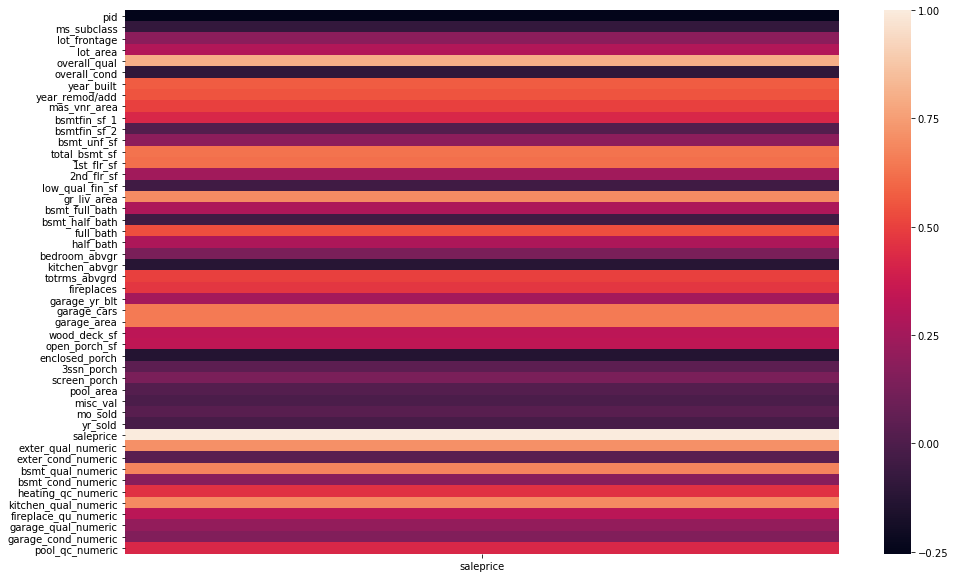

In [45]:
#Correlation HEatmap to show relationships
plt.figure(figsize=(16,10))
sns.heatmap(y_values_corr);

In [46]:
train.replace({np.nan:0.0},inplace=True)

In [47]:
test.replace({np.nan:0.0},inplace=True)

Model and selecting for highley correlated variables and testing.

In [48]:
X_train_high_corr=train[['lot_area','overall_qual','year_built',
'year_remod/add','1st_flr_sf','2nd_flr_sf','low_qual_fin_sf',
'gr_liv_area','full_bath','half_bath','bedroom_abvgr','totrms_abvgrd',
'wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','misc_val'
,'bsmt_qual_numeric','heating_qc_numeric','kitchen_qual_numeric',
'fireplace_qu_numeric','garage_qual_numeric','pool_qc_numeric']]
y_train=train['saleprice']

In [49]:
X_test_high_corr=test[['lot_area','overall_qual','year_built',
'year_remod/add','1st_flr_sf','2nd_flr_sf','low_qual_fin_sf',
'gr_liv_area','full_bath','half_bath','bedroom_abvgr','totrms_abvgrd',
'wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','misc_val'
,'bsmt_qual_numeric','heating_qc_numeric','kitchen_qual_numeric',
'fireplace_qu_numeric','garage_qual_numeric','pool_qc_numeric']]

In [50]:
ss=StandardScaler()
ss.fit(X_train_high_corr)
X_train_high_corr_sc=ss.transform(X_train_high_corr)
X_test_high_corr_sc=ss.transform(X_test_high_corr)

/Users/shanelljones/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/shanelljones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/shanelljones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: DataConversionWarning: Data with input dtype int64, float64 were all converted to float64 by StandardScaler.
  after removing the cwd from sys.path.


In [51]:
model_high_saleprice_corr=LinearRegression()
model_high_saleprice_corr.fit(X_train_high_corr_sc,y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None,
         normalize=False)

In [52]:
model_high_saleprice_corr.score(X_train_high_corr_sc,y_train)

0.8261147676571101

In [53]:
preds_high_corr=model_high_saleprice_corr.predict(X_test_high_corr_sc)

In [54]:
test['saleprice']=preds_high_corr

In [55]:
y_high_corr=test['saleprice']

In [56]:
model_high_saleprice_corr.score(X_test_high_corr_sc,y_high_corr)

1.0

In [57]:
submission_7=test[['saleprice']]

In [58]:
submission_7.to_csv('./datasets/submission_10_2_19_2.csv')

In [59]:
train

,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,exter_qual_numeric,exter_cond_numeric,bsmt_qual_numeric,bsmt_cond_numeric,heating_qc_numeric,kitchen_qual_numeric,fireplace_qu_numeric,garage_qual_numeric,garage_cond_numeric,pool_qc_numeric
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,526301100,20,RL,141.0,31770,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0,TA,TA,CBlock,TA,Gd,Gd,BLQ,639.0,Unf,0.0,441.0,1080.0,GasA,Fa,Y,SBrkr,1656,0,0,1656,1.0,0.0,1,0,3,1,TA,7,Typ,2,Gd,Attchd,1960.0,Fin,2.0,528.0,TA,TA,P,210,62,0,0,0,0,0,0,0,0,5,2010,WD,215000,3,3,3.0,4.0,2,3,4.0,3.0,3.0,0.0
3,526351010,20,RL,81.0,14267,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,0,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,0,0,Gar2,12500,6,2010,WD,172000,3,3,3.0,3.0,3,4,0.0,3.0,3.0,0.0
5,527105010,60,RL,74.0,13830,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,0,MnPrv,0,0,3,2010,WD,189900,3,3,4.0,3.0,4,3,3.0,3.0,3.0,0.0
8,527145080,120,RL,43.0,5005,Pave,0,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,0,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,0,0,0,0,1,2010,WD,191500,4,3,4.0,3.0,5,4,0.0,3.0,3.0,0.0
9,527146030,120,RL,39.0,5389,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1995,1996,Gable,CompShg,CemntBd,CmentBd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,1180.0,Unf,0.0,415.0,1595.0,GasA,Ex,Y,SBrkr,1616,0,0,1616,1.0,0.0,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1995.0,RFn,2.0,608.0,TA,TA,Y,237,152,0,0,0,0,0,0,0,0,3,2010,WD,236500,4,3,4.0,3.0,5,4,3.0,3.0,3.0,0.0
10,527162130,60,RL,60.0,7500,Pave,0,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,7,5,1999,1999,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,TA,TA,No,Unf,0.0,Unf,0.0,994.0,994.0,GasA,Gd,Y,SBrkr,1028,776,0,1804,0.0,0.0,2,1,3,1,Gd,7,Typ,1,TA,Attchd,1999.0,Fin,2.0,442.0,TA,TA,Y,140,60,0,0,0,0,0,0,0,0,6,2010,WD,189000,3,3,3.0,3.0,4,4,3.0,3.0,3.0,0.0
11,527163010,60,RL,75.0,10000,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,5,1993,1994,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,TA,PConc,Gd,TA,No,Unf,0.0,Unf,0.0,763.0,763.0,GasA,Gd,Y,SBrkr,763,892,0,1655,0.0,0.0,2,1,3,1,TA,7,Typ,1,TA,Attchd,1993.0,Fin,2.0,440.0,TA,TA,Y,157,84,0,0,0,0,0,0,0,0,4,2010,WD,175900,3,3,4.0,3.0,4,3,3.0,3.0,3.0,0.0
12,527165230,20,RL,0.0,7980,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,1Story,6,7,1992,2007,Gable,CompShg,HdBoard,HdBoard,None,0.0,TA,Gd,PConc,Gd,TA,No,ALQ,935.0,Unf,0.0,233.0,1168.0,GasA,Ex,Y,SBrkr,11

In [60]:
X_train_high_corr

,lot_area,overall_qual,year_built,year_remod/add,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,full_bath,half_bath,bedroom_abvgr,totrms_abvgrd,wood_deck_sf,enclosed_porch,3ssn_porch,screen_porch,misc_val,bsmt_qual_numeric,heating_qc_numeric,kitchen_qual_numeric,fireplace_qu_numeric,garage_qual_numeric,pool_qc_numeric
Id,,,,,,,,,,,,,,,,,,,,,,,
1,31770,6,1960,1960,1656,0,0,1656,1,0,3,7,210,0,0,0,0,3.0,2,3,4.0,3.0,0.0
3,14267,6,1958,1958,1329,0,0,1329,1,1,3,6,393,0,0,0,12500,3.0,3,4,0.0,3.0,0.0
5,13830,5,1997,1998,928,701,0,1629,2,1,3,6,212,0,0,0,0,4.0,4,3,3.0,3.0,0.0
8,5005,8,1992,1992,1280,0,0,1280,2,0,2,5,0,0,0,144,0,4.0,5,4,0.0,3.0,0.0
9,5389,8,1995,1996,1616,0,0,1616,2,0,2,5,237,0,0,0,0,4.0,5,4,3.0,3.0,0.0
10,7500,7,1999,1999,1028,776,0,1804,2,1,3,7,140,0,0,0,0,3.0,4,4,3.0,3.0,0.0
11,10000,6,1993,1994,763,892,0,1655,2,1,3,7,157,0,0,0,0,4.0,4,3,3.0,3.0,0.0
12,7980,6,1992,2007,1187,0,0,1187,2,0,3,6,483,0,0,0,500,4.0,5,3,0.0,3.0,0.0
13,8402,6,1998,1998,789,676,0,1465,2,1,3,7,0,0,0,0,0,4.0,4,3,4.0,3.0,0.0


Create dummy variables to use and increase the testing explaniroty values of some of these cateogrical variables.

In [61]:
train_dummies=pd.get_dummies(train,columns=['sale_type'],drop_first=True)
test_dummies=pd.get_dummies(test,columns=['sale_type'],drop_first=True)

In [62]:
train_dummies.columns

Index(['pid', 'ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area', 'street',
       'alley', 'lot_shape', 'land_contour', 'utilities', 'lot_config',
       'land_slope', 'neighborhood', 'condition_1', 'condition_2', 'bldg_type',
       'house_style', 'overall_qual', 'overall_cond', 'year_built',
       'year_remod/add', 'roof_style', 'roof_matl', 'exterior_1st',
       'exterior_2nd', 'mas_vnr_type', 'mas_vnr_area', 'exter_qual',
       'exter_cond', 'foundation', 'bsmt_qual', 'bsmt_cond', 'bsmt_exposure',
       'bsmtfin_type_1', 'bsmtfin_sf_1', 'bsmtfin_type_2', 'bsmtfin_sf_2',
       'bsmt_unf_sf', 'total_bsmt_sf', 'heating', 'heating_qc', 'central_air',
       'electrical', '1st_flr_sf', '2nd_flr_sf', 'low_qual_fin_sf',
       'gr_liv_area', 'bsmt_full_bath', 'bsmt_half_bath', 'full_bath',
       'half_bath', 'bedroom_abvgr', 'kitchen_abvgr', 'kitchen_qual',
       'totrms_abvgrd', 'functional', 'fireplaces', 'fireplace_qu',
       'garage_type', 'garage_yr_blt', 'garage_finish'

In [63]:
train['garage_area'].replace(np.nan,0,inplace=True)

In [64]:
train['garage_cars'].replace(np.nan,0,inplace=True)

In [65]:
(train_dummies.corr()[['saleprice']])

,saleprice
pid,-0.255052
ms_subclass,-0.087335
lot_frontage,0.181456
lot_area,0.296566
overall_qual,0.800207
overall_cond,-0.097019
year_built,0.571849
year_remod/add,0.550370
mas_vnr_area,0.503579
bsmtfin_sf_1,0.423856


Creating another model using the dummy variables and previous data to scale the model for further use.

In [66]:
X_train_high_corr_sale_type=train_dummies[['lot_area','overall_qual','year_built',
'year_remod/add','1st_flr_sf','2nd_flr_sf','low_qual_fin_sf',
'gr_liv_area','full_bath','half_bath','bedroom_abvgr','totrms_abvgrd',
'wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','misc_val'
,'bsmt_qual_numeric','heating_qc_numeric','kitchen_qual_numeric',
'fireplace_qu_numeric','garage_qual_numeric', 'sale_type_CWD', 'sale_type_Con', 
'sale_type_ConLD', 'sale_type_ConLI','sale_type_ConLw', 'sale_type_New',
'sale_type_Oth', 'sale_type_WD ','garage_cond_numeric']]
X_test_high_corr_sale_type=test_dummies[['lot_area','overall_qual','year_built',
'year_remod/add','1st_flr_sf','2nd_flr_sf','low_qual_fin_sf',
'gr_liv_area','full_bath','half_bath','bedroom_abvgr','totrms_abvgrd',
'wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','misc_val'
,'bsmt_qual_numeric','heating_qc_numeric','kitchen_qual_numeric',
'fireplace_qu_numeric','garage_qual_numeric','sale_type_CWD','sale_type_Con', 
'sale_type_ConLD','sale_type_ConLI','sale_type_ConLw', 'sale_type_New',
'sale_type_Oth','sale_type_WD ','garage_cond_numeric']]

In [67]:
ss=StandardScaler()
ss.fit(X_train_high_corr_sale_type)
X_train_high_corr_sale_type_sc=ss.transform(X_train_high_corr_sale_type)
X_test_high_corr_sale_type_sc=ss.transform(X_test_high_corr_sale_type)

/Users/shanelljones/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/shanelljones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/shanelljones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  after removing the cwd from sys.path.


In [68]:
model_high_saleprice_corr_air=LinearRegression()
model_high_saleprice_corr_air.fit(X_train_high_corr_sale_type_sc,y_train)
model_high_saleprice_corr_air.score(X_train_high_corr_sale_type_sc,y_train)

0.8275605433650675

In [69]:
preds_sale_type=model_high_saleprice_corr_air.predict(X_test_high_corr_sale_type_sc)

In [70]:
test['saleprice']=preds_sale_type

In [71]:
submission_8=test[['saleprice']]

In [72]:
submission_8.to_csv('./datasets/submission_10_2_19_3.csv')

In [73]:
train_dummies.house_style.value_counts()

1Story    1059
2Story     598
1.5Fin     218
SLvl        94
SFoyer      50
2.5Unf      14
1.5Unf      12
2.5Fin       6
Name: house_style, dtype: int64

In [74]:
train_dummies=pd.get_dummies(train_dummies,columns=['house_style'])
test_dummies=pd.get_dummies(test_dummies,columns=['house_style'])

In [75]:
train_dummies.columns

Index(['pid', 'ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area', 'street',
       'alley', 'lot_shape', 'land_contour', 'utilities',
       ...
       'sale_type_Oth', 'sale_type_WD ', 'house_style_1.5Fin',
       'house_style_1.5Unf', 'house_style_1Story', 'house_style_2.5Fin',
       'house_style_2.5Unf', 'house_style_2Story', 'house_style_SFoyer',
       'house_style_SLvl'],
      dtype='object', length=104)

In [76]:
train_dummies.drop(columns='house_style_2.5Fin', inplace=True)

In [77]:
([col for col in train_dummies.columns if col not in test_dummies.columns],[col for col in test_dummies.columns if col not in train_dummies.columns])

([], ['sale_type_VWD', 'house_style_2.5Fin'])

In [78]:
train_dummies['sale_type_VWD']=0.0

In [79]:
([col for col in train_dummies.columns if col not in test_dummies.columns],[col for col in test_dummies.columns if col not in train_dummies.columns])

([], ['house_style_2.5Fin'])

In [80]:
test_dummies.drop(columns='house_style_2.5Fin', inplace=True)

In [81]:
(train_dummies.corr()[['saleprice']])

,saleprice
pid,-0.255052
ms_subclass,-0.087335
lot_frontage,0.181456
lot_area,0.296566
overall_qual,0.800207
overall_cond,-0.097019
year_built,0.571849
year_remod/add,0.550370
mas_vnr_area,0.503579
bsmtfin_sf_1,0.423856


In [82]:
X_train_high_corr_sale_house_type=train_dummies[['lot_area','overall_qual','year_built',
'year_remod/add','1st_flr_sf','2nd_flr_sf','low_qual_fin_sf',
'gr_liv_area','full_bath','half_bath','bedroom_abvgr','totrms_abvgrd',
'wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','misc_val'
,'bsmt_qual_numeric','heating_qc_numeric','kitchen_qual_numeric',
'fireplace_qu_numeric','garage_qual_numeric', 'sale_type_CWD', 'sale_type_Con', 
'sale_type_ConLD', 'sale_type_ConLI','sale_type_ConLw', 'sale_type_New',
'sale_type_Oth', 'sale_type_WD ','garage_cond_numeric','house_style_1.5Fin',
       'house_style_1.5Unf', 'house_style_1Story', 'house_style_2.5Unf',
       'house_style_2Story', 'house_style_SFoyer', 'house_style_SLvl',
       'sale_type_VWD']]
X_test_high_corr_sale_house_type=test_dummies[['lot_area','overall_qual','year_built',
'year_remod/add','1st_flr_sf','2nd_flr_sf','low_qual_fin_sf',
'gr_liv_area','full_bath','half_bath','bedroom_abvgr','totrms_abvgrd',
'wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','misc_val'
,'bsmt_qual_numeric','heating_qc_numeric','kitchen_qual_numeric',
'fireplace_qu_numeric','garage_qual_numeric','sale_type_CWD','sale_type_Con', 
'sale_type_ConLD','sale_type_ConLI','sale_type_ConLw', 'sale_type_New',
'sale_type_Oth','sale_type_WD ','garage_cond_numeric','house_style_1.5Fin',
       'house_style_1.5Unf', 'house_style_1Story', 'house_style_2.5Unf',
       'house_style_2Story', 'house_style_SFoyer', 'house_style_SLvl',
       'sale_type_VWD']]

In [83]:
ss.fit(X_train_high_corr_sale_house_type)
X_train_high_corr_sale_house_type_sc=ss.transform(X_train_high_corr_sale_house_type)
X_test_high_corr_sale_house_type_sc=ss.transform(X_test_high_corr_sale_house_type)

/Users/shanelljones/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/shanelljones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  
/Users/shanelljones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  This is separate from the ipykernel package so we can avoid doing imports until


In [84]:
model_high_corr_sale_house_type=LinearRegression()
model_high_corr_sale_house_type.fit(X_train_high_corr_sale_house_type_sc,y_train)
model_high_corr_sale_house_type.score(X_train_high_corr_sale_house_type_sc,y_train)

0.8304644186544996

In [85]:
preds=model_high_corr_sale_house_type.predict(X_test_high_corr_sale_house_type)

In [86]:
test['saleprice']=preds

In [87]:
test[['saleprice']]=submission_8

In [88]:
submission_8.to_csv('./datasets/submission_10_2_19_4.csv')

Create interaction varibales to change the behavior of some categorical variables and model them more linearly.

In [89]:
train_dummies['Interaction_bed_bath']=train_dummies['full_bath']*train_dummies['half_bath']*train_dummies['bedroom_abvgr']*train_dummies['1st_flr_sf']*train_dummies['1st_flr_sf']
test_dummies['Interaction_bed_bath']=test_dummies['full_bath']*test_dummies['half_bath']*test_dummies['bedroom_abvgr']*test_dummies['1st_flr_sf']*test_dummies['1st_flr_sf']



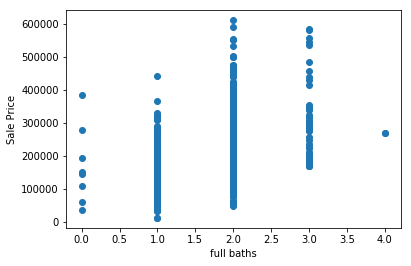

In [90]:
plt.scatter(x=train_dummies['full_bath'],y=train_dummies['saleprice'])
plt.xlabel('full baths')
plt.ylabel('Sale Price');

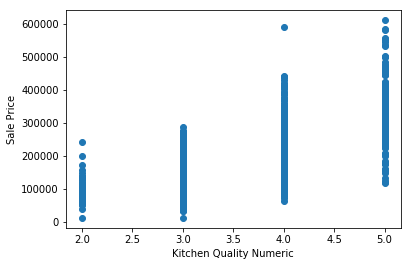

In [91]:
plt.scatter(x=train_dummies['kitchen_qual_numeric'],y=train_dummies['saleprice'])
plt.xlabel('Kitchen Quality Numeric')
plt.ylabel('Sale Price');

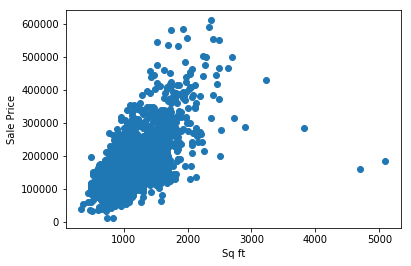

In [92]:
plt.scatter(x=train_dummies['1st_flr_sf'],y=train_dummies['saleprice'])
plt.xlabel('Sq ft')
plt.ylabel('Sale Price');

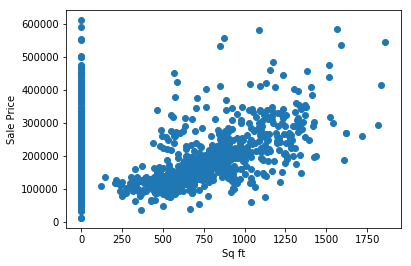

In [93]:
plt.scatter(x=train_dummies['2nd_flr_sf'],y=train_dummies['saleprice'])
plt.xlabel('Sq ft')
plt.ylabel('Sale Price');

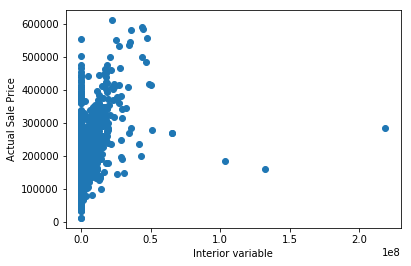

In [94]:
plt.scatter(train_dummies['Interaction_bed_bath'],y_train);
plt.xlabel('Interior variable')
plt.ylabel('Actual Sale Price');

In [95]:
(train_dummies.corr()[['saleprice']])

,saleprice
pid,-0.255052
ms_subclass,-0.087335
lot_frontage,0.181456
lot_area,0.296566
overall_qual,0.800207
overall_cond,-0.097019
year_built,0.571849
year_remod/add,0.550370
mas_vnr_area,0.503579
bsmtfin_sf_1,0.423856


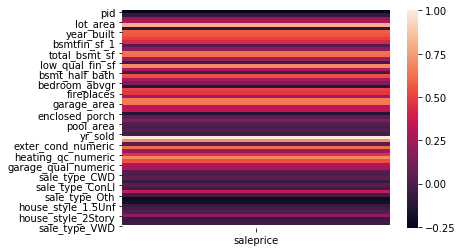

In [96]:
sns.heatmap((train_dummies.corr()[['saleprice']][:-1]));

In [97]:
def change_float_to_int(s):
    obj=int(s)
    return obj

In [98]:
train_dummies['garage_cars']=train_dummies['garage_cars'].apply(change_float_to_int)
train_dummies['garage_area']=train_dummies['garage_area'].apply(change_float_to_int)
train_dummies['bsmtfin_sf_1']=train_dummies['bsmtfin_sf_1'].apply(change_float_to_int)
train_dummies['bsmtfin_sf_2']=train_dummies['bsmtfin_sf_2'].apply(change_float_to_int)
test_dummies['garage_cars']=test_dummies['garage_cars'].apply(change_float_to_int)
test_dummies['garage_area']=test_dummies['garage_area'].apply(change_float_to_int)
test_dummies['bsmtfin_sf_1']=test_dummies['bsmtfin_sf_1'].apply(change_float_to_int)
test_dummies['bsmtfin_sf_2']=test_dummies['bsmtfin_sf_2'].apply(change_float_to_int)

In [99]:
train_dummies['interaction_basement']=train_dummies['bsmt_qual_numeric']*train_dummies['bsmt_cond_numeric']*train_dummies['bsmtfin_sf_1']
test_dummies['interaction_basement']=test_dummies['bsmt_qual_numeric']*test_dummies['bsmt_cond_numeric']*test_dummies['bsmtfin_sf_1']

In [100]:
train_dummies['interaction_garage']=train_dummies['garage_cond_numeric']*train_dummies['garage_cond_numeric']*train_dummies['garage_cars']*train_dummies['garage_area']
test_dummies['interaction_garage']=test_dummies['garage_cond_numeric']*test_dummies['garage_cond_numeric']*test_dummies['garage_cars']*test_dummies['garage_area']


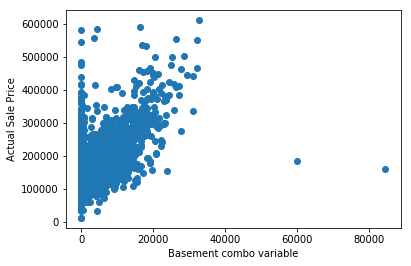

In [101]:
plt.scatter(x=train_dummies['interaction_basement'],y=train_dummies['saleprice'])
plt.xlabel('Basement combo variable')
plt.ylabel('Actual Sale Price');

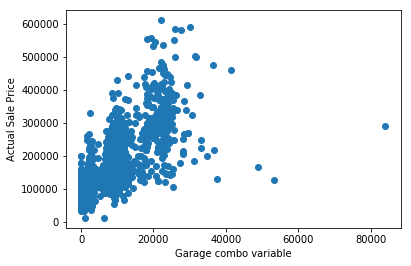

In [102]:
plt.scatter(x=train_dummies['interaction_garage'],y=train_dummies['saleprice'])
plt.xlabel('Garage combo variable')
plt.ylabel('Actual Sale Price');

In [103]:
train_dummies.columns

Index(['pid', 'ms_subclass', 'ms_zoning', 'lot_frontage', 'lot_area', 'street',
       'alley', 'lot_shape', 'land_contour', 'utilities',
       ...
       'house_style_1.5Unf', 'house_style_1Story', 'house_style_2.5Unf',
       'house_style_2Story', 'house_style_SFoyer', 'house_style_SLvl',
       'sale_type_VWD', 'Interaction_bed_bath', 'interaction_basement',
       'interaction_garage'],
      dtype='object', length=107)

In [104]:
test_dummies.replace(np.nan,0,inplace=True)

In [105]:
test_dummies['interaction_garage'].isnull().sum()

0

Create a model based on the previous variables and the interaction data.

In [106]:
X_interaction_dummies=train_dummies[['Interaction_bed_bath', 'interaction_basement',
       'interaction_garage','lot_area','overall_qual','year_built',
'year_remod/add','1st_flr_sf','2nd_flr_sf','low_qual_fin_sf',
'gr_liv_area','totrms_abvgrd',
'wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','misc_val'
,'heating_qc_numeric','kitchen_qual_numeric',
'fireplace_qu_numeric', 'sale_type_CWD', 'sale_type_Con', 
'sale_type_ConLD', 'sale_type_ConLI','sale_type_ConLw', 'sale_type_New',
'sale_type_Oth', 'sale_type_WD ','garage_cond_numeric','house_style_1.5Fin',
       'house_style_1.5Unf', 'house_style_1Story', 'house_style_2.5Unf',
       'house_style_2Story', 'house_style_SFoyer', 'house_style_SLvl',
       'sale_type_VWD']]
X_interaction_dummies_test=test_dummies[['Interaction_bed_bath', 'interaction_basement',
       'interaction_garage','lot_area','overall_qual','year_built',
'year_remod/add','1st_flr_sf','2nd_flr_sf','low_qual_fin_sf',
'gr_liv_area','totrms_abvgrd',
'wood_deck_sf','enclosed_porch','3ssn_porch','screen_porch','misc_val'
,'heating_qc_numeric','kitchen_qual_numeric',
'fireplace_qu_numeric', 'sale_type_CWD', 'sale_type_Con', 
'sale_type_ConLD', 'sale_type_ConLI','sale_type_ConLw', 'sale_type_New',
'sale_type_Oth', 'sale_type_WD ','garage_cond_numeric','house_style_1.5Fin',
       'house_style_1.5Unf', 'house_style_1Story', 'house_style_2.5Unf',
       'house_style_2Story', 'house_style_SFoyer', 'house_style_SLvl',
       'sale_type_VWD']]

In [107]:
ss=StandardScaler()
X_interaction_dummies_sc=ss.fit_transform(X_interaction_dummies)
X_interaction_dummies_sc_test=ss.transform(X_interaction_dummies_test)

/Users/shanelljones/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/data.py:645: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
/Users/shanelljones/anaconda3/lib/python3.7/site-packages/sklearn/base.py:464: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)
/Users/shanelljones/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: DataConversionWarning: Data with input dtype uint8, int64, float64 were all converted to float64 by StandardScaler.
  This is separate from the ipykernel package so we can avoid doing imports until


In [108]:
model=LinearRegression()
model.fit(X_interaction_dummies_sc,y_train)
model.score(X_interaction_dummies_sc,y_train)

0.8468389002456495

In [109]:
X_interaction_dummies_test['interaction_garage'].isnull().sum()

0

In [110]:
X_interaction_dummies_sc_test

array([[-0.34615419, -0.14762065, -0.33633188, ..., -0.15807437,
        -0.21916364,  0.        ],
       [ 2.74894287,  0.7224647 ,  0.07488401, ..., -0.15807437,
        -0.21916364,  0.        ],
       [ 0.24996258,  0.04767489, -0.06131489, ..., -0.15807437,
        -0.21916364,  0.        ],
       ...,
       [-0.34615419,  0.53445631,  0.2110829 , ..., -0.15807437,
        -0.21916364,  0.        ],
       [-0.34615419,  0.95419597,  0.21632132, ..., -0.15807437,
        -0.21916364,  0.        ],
       [-0.34615419, -0.17482599, -1.29234333, ...,  6.32613626,
        -0.21916364,  0.        ]])

In [111]:
preds_interaction=model.predict(X_interaction_dummies_sc_test)

In [112]:
test_dummies['saleprice']=preds_interaction

In [113]:
sumbission_9=test_dummies[['saleprice']]

In [114]:
sumbission_9.to_csv('./datasets/submission_10_3_19_1.csv')

In [115]:
preds=model.predict(X_interaction_dummies_sc)

Create a scatter plot in order to show the prediction relationship of the model.

In [116]:
resids=train_dummies['saleprice']-preds

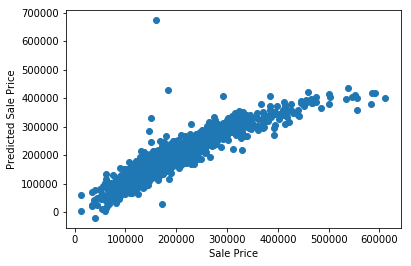

In [117]:
plt.scatter(train_dummies['saleprice'],preds)
plt.xlabel('Sale Price')
plt.ylabel('Predicted Sale Price');

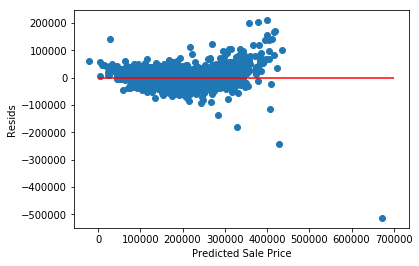

In [118]:
plt.scatter(preds,resids)
plt.hlines(-10, 700000, 15, color='r');
plt.xlabel('Predicted Sale Price')
plt.ylabel('Resids');

Create a model based on the log information in order to show correct the behavior of the model to ensure a more linear relationship.

In [119]:
train_dummies['saleprice_natural_log']=np.log(train_dummies['saleprice'])

In [120]:
y_train_ln=train_dummies['saleprice_natural_log']

In [121]:
model.fit(X_interaction_dummies_sc,y_train_ln)
model.score(X_interaction_dummies_sc,y_train_ln)

0.8619870435072272

In [122]:
preds_interaction_ln=model.predict(X_interaction_dummies_sc_test)

In [123]:
test_dummies['saleprice']=np.exp(preds_interaction_ln)
test_dummies['saleprice']

Id
2       121308.051421
4       221313.520248
6       194274.698910
7       218269.563693
17      228692.879106
18      375285.423428
22      179662.938468
27      109645.475683
31      107449.003673
36      138775.697967
39      352979.330637
40      245746.964744
42      302422.279268
46      226845.045897
53      179373.990884
58      197169.709844
61      308383.438984
72      244108.103693
79      137520.310818
80      215743.495647
82      163480.488108
83      103710.732663
85      144240.895794
88      116167.870627
92      269779.092291
93      271247.235161
95      180211.743696
102     163245.558373
103     176823.238280
106     241692.144400
107     165158.986423
110     231174.610672
114     189917.376858
116     169036.441779
117     141640.475641
118     125904.262779
125     152281.752381
126     158474.235029
127     133425.110743
128     195133.627283
134     132194.041552
135     163764.725583
137     251257.060955
143     128049.980413
147     120267.629372
148    

In [124]:
sumbission_10=test_dummies[['saleprice']]
sumbission_10.to_csv('./datasets/submission_10_3_19_2.csv')

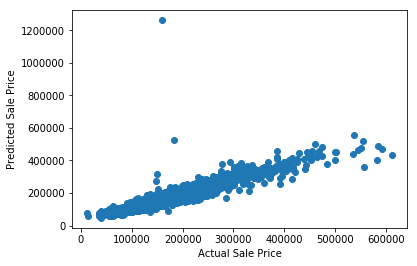

In [125]:
plt.scatter(train['saleprice'],np.exp(model.predict(X_interaction_dummies_sc)))
plt.xlabel('Actual Sale Price')
plt.ylabel('Predicted Sale Price');

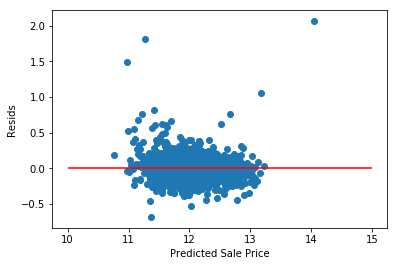

In [126]:
plt.scatter(model.predict(X_interaction_dummies_sc),
                   model.predict(X_interaction_dummies_sc)-train_dummies['saleprice_natural_log'])
plt.hlines(0, 10, 15, color='r');
plt.xlabel('Predicted Sale Price')
plt.ylabel('Resids');

Use Lasso in order to test the final model to ensure the model is not overfit and variables are necessary.

In [127]:
from sklearn.linear_model import LassoCV

In [128]:
lm=LinearRegression()
lm.fit(X_interaction_dummies_sc, train_dummies['saleprice_natural_log'])
lm.score(X_interaction_dummies_sc, train_dummies['saleprice_natural_log'])

0.8619870435072272

In [129]:
l_alphas = np.logspace(-3, 0, 100)
lasso_model = LassoCV(alphas=l_alphas, cv=5, max_iter=5000)
lasso_model = lasso_model.fit(X_interaction_dummies_sc, train_dummies['saleprice_natural_log'])

In [130]:
print(lasso_model.score(X_interaction_dummies_sc, train_dummies['saleprice_natural_log']))

0.8615707708148809


In [131]:
lasso_model.coef_

array([-0.02818069,  0.03676171,  0.02210724,  0.02788198,  0.12614947,
        0.06074073,  0.03381592,  0.01249832,  0.        , -0.00712454,
        0.11759893,  0.01724874,  0.01722848,  0.00922596,  0.00482045,
        0.02622355, -0.02451323,  0.02755764,  0.02302909,  0.02876915,
        0.00455914,  0.00714834, -0.00091877,  0.        ,  0.        ,
        0.01612005,  0.00522388,  0.01430331,  0.03290276, -0.0001881 ,
        0.00117401,  0.0050877 ,  0.00171073, -0.01825552,  0.00629632,
        0.        ,  0.        ])

In [132]:
model.coef_

array([-3.05895114e-02,  3.74563108e-02,  2.11819567e-02,  2.84383960e-02,
        1.26378334e-01,  6.04651954e-02,  3.39596300e-02, -2.97791966e+11,
       -3.19743729e+11, -3.83604923e+10,  3.75912472e+11,  1.83732051e-02,
        1.80648825e-02,  1.03660409e-02,  5.52138738e-03,  2.73488302e-02,
       -2.55479515e-02,  2.78591232e-02,  2.25946861e-02,  2.81881233e-02,
        7.25548183e-03,  9.32565149e-03, -2.47105049e-05,  2.37687994e-03,
        1.51845095e-03,  2.39482501e-02,  7.22368812e-03,  2.27211224e-02,
        3.39515068e-02,  2.53437850e-02,  1.00676580e-02,  5.66513733e-02,
        8.62457278e-03,  1.61309105e-02,  2.29447679e-02,  2.04710986e-02,
        0.00000000e+00])

In [141]:
train.head()

,pid,ms_subclass,ms_zoning,lot_frontage,lot_area,street,alley,lot_shape,land_contour,utilities,lot_config,land_slope,neighborhood,condition_1,condition_2,bldg_type,house_style,overall_qual,overall_cond,year_built,year_remod/add,roof_style,roof_matl,exterior_1st,exterior_2nd,mas_vnr_type,mas_vnr_area,exter_qual,exter_cond,foundation,bsmt_qual,bsmt_cond,bsmt_exposure,bsmtfin_type_1,bsmtfin_sf_1,bsmtfin_type_2,bsmtfin_sf_2,bsmt_unf_sf,total_bsmt_sf,heating,heating_qc,central_air,electrical,1st_flr_sf,2nd_flr_sf,low_qual_fin_sf,gr_liv_area,bsmt_full_bath,bsmt_half_bath,full_bath,half_bath,bedroom_abvgr,kitchen_abvgr,kitchen_qual,totrms_abvgrd,functional,fireplaces,fireplace_qu,garage_type,garage_yr_blt,garage_finish,garage_cars,garage_area,garage_qual,garage_cond,paved_drive,wood_deck_sf,open_porch_sf,enclosed_porch,3ssn_porch,screen_porch,pool_area,pool_qc,fence,misc_feature,misc_val,mo_sold,yr_sold,sale_type,saleprice,exter_qual_numeric,exter_cond_numeric,bsmt_qual_numeric,bsmt_cond_numeric,heating_qc_numeric,kitchen_qual_numeric,fireplace_qu_numeric,garage_qual_numeric,garage_cond_numeric,pool_qc_numeric
Id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1,526301100,20,RL,141.0,31770,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0,TA,TA,CBlock,TA,Gd,Gd,BLQ,639.0,Unf,0.0,441.0,1080.0,GasA,Fa,Y,SBrkr,1656,0,0,1656,1.0,0.0,1,0,3,1,TA,7,Typ,2,Gd,Attchd,1960.0,Fin,2.0,528.0,TA,TA,P,210,62,0,0,0,0,0,0,0,0,5,2010,WD,215000,3,3,3.0,4.0,2,3,4.0,3.0,3.0,0.0
3,526351010,20,RL,81.0,14267,Pave,0,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,0,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,0,0,Gar2,12500,6,2010,WD,172000,3,3,3.0,3.0,3,4,0.0,3.0,3.0,0.0
5,527105010,60,RL,74.0,13830,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,0,MnPrv,0,0,3,2010,WD,189900,3,3,4.0,3.0,4,3,3.0,3.0,3.0,0.0
8,527145080,120,RL,43.0,5005,Pave,0,IR1,HLS,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1992,1992,Gable,CompShg,HdBoard,HdBoard,None,0.0,Gd,TA,PConc,Gd,TA,No,ALQ,263.0,Unf,0.0,1017.0,1280.0,GasA,Ex,Y,SBrkr,1280,0,0,1280,0.0,0.0,2,0,2,1,Gd,5,Typ,0,0,Attchd,1992.0,RFn,2.0,506.0,TA,TA,Y,0,82,0,0,144,0,0,0,0,0,1,2010,WD,191500,4,3,4.0,3.0,5,4,0.0,3.0,3.0,0.0
9,527146030,120,RL,39.0,5389,Pave,0,IR1,Lvl,AllPub,Inside,Gtl,StoneBr,Norm,Norm,TwnhsE,1Story,8,5,1995,1996,Gable,CompShg,CemntBd,CmentBd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,1180.0,Unf,0.0,415.0,1595.0,GasA,Ex,Y,SBrkr,1616,0,0,1616,1.0,0.0,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1995.0,RFn,2.0,608.0,TA,TA,Y,237,152,0,0,0,0,0,0,0,0,3,2010,WD,236500,4,3,4.0,3.0,5,4,3.0,3.0,3.0,0.0


In [143]:
X_interaction_dummies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2051 entries, 1 to 2930
Data columns (total 37 columns):
Interaction_bed_bath    2051 non-null int64
interaction_basement    2051 non-null float64
interaction_garage      2051 non-null float64
lot_area                2051 non-null int64
overall_qual            2051 non-null int64
year_built              2051 non-null int64
year_remod/add          2051 non-null int64
1st_flr_sf              2051 non-null int64
2nd_flr_sf              2051 non-null int64
low_qual_fin_sf         2051 non-null int64
gr_liv_area             2051 non-null int64
totrms_abvgrd           2051 non-null int64
wood_deck_sf            2051 non-null int64
enclosed_porch          2051 non-null int64
3ssn_porch              2051 non-null int64
screen_porch            2051 non-null int64
misc_val                2051 non-null int64
heating_qc_numeric      2051 non-null int64
kitchen_qual_numeric    2051 non-null int64
fireplace_qu_numeric    2051 non-null float64
sale_ty